# Loading Dataset and Data Preprocessing

In [ ]:
import numpy as np
from PIL import Image
import os
import tensorflow as tf
from tensorflow import keras

def load_dataset(dataset_path, img_height, img_width):
    images = []
    labels = []
    class_to_label = {}
    classes = os.listdir(dataset_path)

    # Iterate over subfolders in the dataset directory
    for i, class_name in enumerate(classes):
        class_to_label[class_name] = i
        class_path = os.path.join(dataset_path, class_name)

        # Iterate over images in the class directory
        for filename in os.listdir(class_path):
            img_path = os.path.join(class_path, filename)

            # Load and resize image
            img = Image.open(img_path).resize((img_width, img_height))
            img = tf.cast(img, tf.float32) / 255  # Normalize image
            img_array = np.array(img)
            images.append(img_array)
            labels.append(i)  # Assign the label index

    # Convert lists to numpy arrays
    images = np.array(images)
    labels = np.array(labels)

    return images, labels, class_to_label

# Dataset directory
dataset_path = '/content/drive/MyDrive/ColabNotebooks/COMP3931/Subset_Dataset'
img_size = 80

# Load the dataset
X_train, y_train, class_to_label = load_dataset(dataset_path, img_size, img_size)

print("Shape of images array:", X_train.shape)
print("Shape of labels array:", y_train.shape)

Shape of images array: (1200, 80, 80, 3)
Shape of labels array: (1200,)


In [ ]:
BUFFER_SIZE = 1200
BATCH_SIZE = 128
# Batch and shuffle the data
train_dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

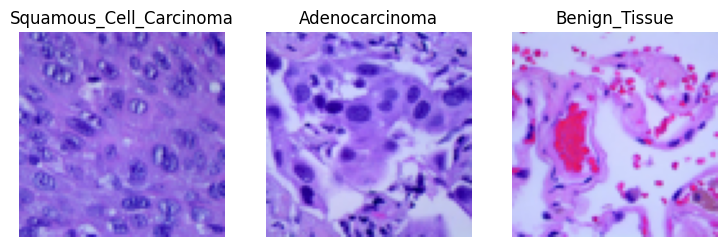

In [ ]:
import matplotlib.pyplot as plt

# Plot one image of each class
fig, axes = plt.subplots(1, len(class_to_label), figsize=(9, 3))

for i, class_name in enumerate(class_to_label):
    # First image of each class
    index = np.where(y_train == class_to_label[class_name])[0][0]
    image = X_train[index]
    axes[i].imshow(image)
    axes[i].set_title(class_name)
    axes[i].axis('off')

plt.show()

# Discriminator

In [ ]:
from keras.models import Sequential
from keras.layers import Input, Conv2D , Conv2DTranspose , Dense , BatchNormalization , LeakyReLU , Flatten , Dropout , Reshape

discriminator = Sequential()

discriminator.add(Input(shape = (img_size, img_size, 3)))

discriminator.add(Conv2D(16 , 4 , (2 , 2) , padding = 'same')) # Conv2D detects features and shrinks input
discriminator.add(BatchNormalization())
discriminator.add(LeakyReLU(0.01)) # returns a small negative value for negative inputs

discriminator.add(Conv2D(32 , 4 , (2 , 2) , padding = 'same'))
discriminator.add(BatchNormalization())
discriminator.add(LeakyReLU(0.01))

discriminator.add(Conv2D(64 , 4 , (2 , 2) , padding = 'same'))
discriminator.add(BatchNormalization())
discriminator.add(LeakyReLU(0.01))

discriminator.add(Conv2D(128 , 4 , (2 , 2) , padding = 'same'))
discriminator.add(BatchNormalization())
discriminator.add(LeakyReLU(0.01))

discriminator.add(Conv2D(256 , 4 , (2 , 2) , padding = 'same'))
discriminator.add(BatchNormalization())
discriminator.add(LeakyReLU(0.01))

discriminator.add(Dropout(0.2))
discriminator.add(Flatten())
discriminator.add(Dropout(0.2))
discriminator.add(Dense(1 , activation = 'sigmoid')) # output [0,1]

discriminator.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_44 (Conv2D)          (None, 40, 40, 16)        784       
                                                                 
 batch_normalization_56 (Ba  (None, 40, 40, 16)        64        
 tchNormalization)                                               
                                                                 
 leaky_re_lu_56 (LeakyReLU)  (None, 40, 40, 16)        0         
                                                                 
 conv2d_45 (Conv2D)          (None, 20, 20, 32)        8224      
                                                                 
 batch_normalization_57 (Ba  (None, 20, 20, 32)        128       
 tchNormalization)                                               
                                                                 
 leaky_re_lu_57 (LeakyReLU)  (None, 20, 20, 32)      

# Generator

In [ ]:
latent_dim = 128
generator = Sequential()

generator.add(Dense(5 * 5 * 256, input_shape=(latent_dim,)))
generator.add(Reshape((5, 5, 256)))
generator.add(BatchNormalization())
generator.add(LeakyReLU(0.01))

# Conv2DTranspose creates features and enlarges input
generator.add(Conv2DTranspose(128 , 4 , (2 , 2) , padding='same'))
generator.add(BatchNormalization())
generator.add(LeakyReLU(0.01))

generator.add(Conv2DTranspose(64 , 4 , (2 , 2) , padding='same'))
generator.add(BatchNormalization())
generator.add(LeakyReLU(0.01))

generator.add(Conv2DTranspose(32 , 4 , (2 , 2) , padding='same'))
generator.add(BatchNormalization())
generator.add(LeakyReLU(0.01))

generator.add(Conv2DTranspose(3 , 4 , (2 , 2) , padding='same' , activation= 'tanh')) # output [-1,1] and 3 is the channel

generator.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_13 (Dense)            (None, 6400)              825600    
                                                                 
 reshape_3 (Reshape)         (None, 5, 5, 256)         0         
                                                                 
 batch_normalization_61 (Ba  (None, 5, 5, 256)         1024      
 tchNormalization)                                               
                                                                 
 leaky_re_lu_61 (LeakyReLU)  (None, 5, 5, 256)         0         
                                                                 
 conv2d_transpose_12 (Conv2  (None, 10, 10, 128)       524416    
 DTranspose)                                                     
                                                                 
 batch_normalization_62 (Ba  (None, 10, 10, 128)     

In [ ]:
from keras.losses import BinaryCrossentropy
from keras.optimizers import Adam

# Optimizers
gen_optimizer = Adam(learning_rate=0.001)
disc_optimizer = Adam(learning_rate=0.001)
loss = BinaryCrossentropy() # compute loss b/w real and fake labels

# Training

In [ ]:
# Training code adapted from https://www.tensorflow.org/tutorials/generative/dcgan

def discriminator_loss(real , fake) :
    real_loss = loss(tf.ones_like(real) , real)
    fake_loss = loss(tf.zeros_like(fake) , fake)

    total_loss = real_loss + fake_loss

    return total_loss

def generator_loss(fake) :
    return loss(tf.ones_like(fake) , fake)

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, 128])
    # Train generator and discriminator
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        fake_images = generator(noise, training=True)

        real = discriminator(images, training=True)
        fake = discriminator(fake_images, training=True)

        gen_loss = generator_loss(fake)
        disc_loss = discriminator_loss(real, fake)

    # Gradients - to adjust the parameters of the generator/discriminator to minimize loss
    gen_gradients = gen_tape.gradient(gen_loss, generator.trainable_variables)
    disc_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # Gradient clipping to prevent gradient explosion by limiting their norm
    gen_gradients = [tf.clip_by_norm(grad, 5.0) for grad in gen_gradients]
    disc_gradients = [tf.clip_by_norm(grad, 5.0) for grad in disc_gradients]

    gen_optimizer.apply_gradients(zip(gen_gradients, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(disc_gradients, discriminator.trainable_variables))

    return gen_loss, disc_loss

Epochs: 25, Generator Loss: 10.12608528137207, Discriminator Loss: 0.00029901444213464856


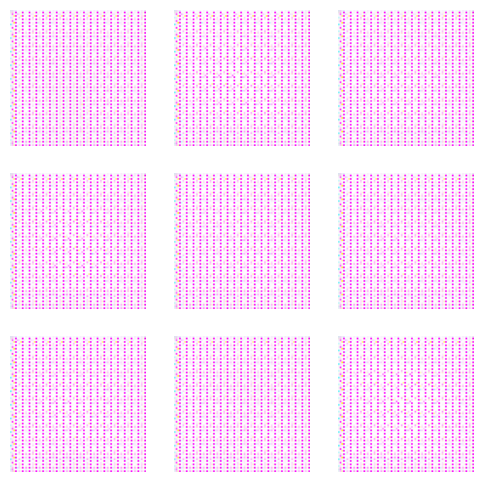

Epochs: 50, Generator Loss: 21.187633514404297, Discriminator Loss: 0.04370709881186485


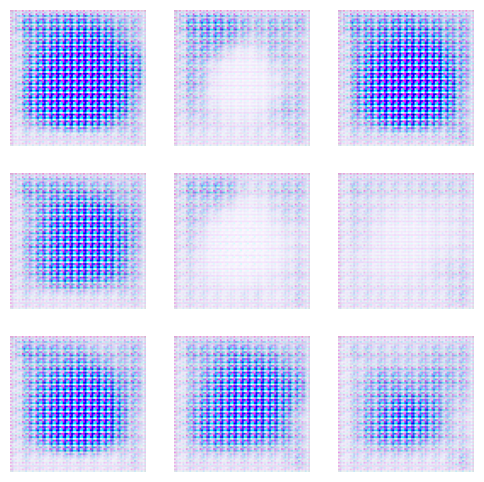

Epochs: 75, Generator Loss: 12.887031555175781, Discriminator Loss: 0.010892863385379314


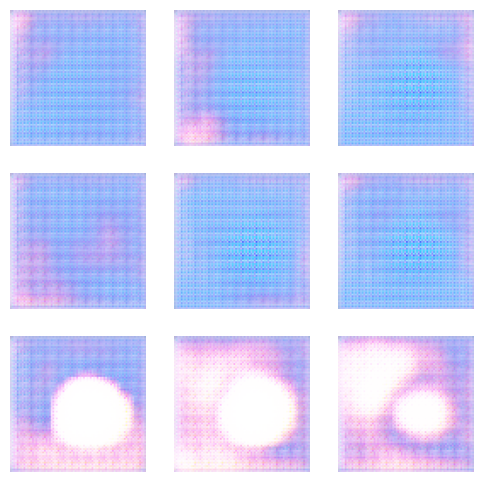

Epochs: 100, Generator Loss: 10.963299751281738, Discriminator Loss: 0.012845998629927635


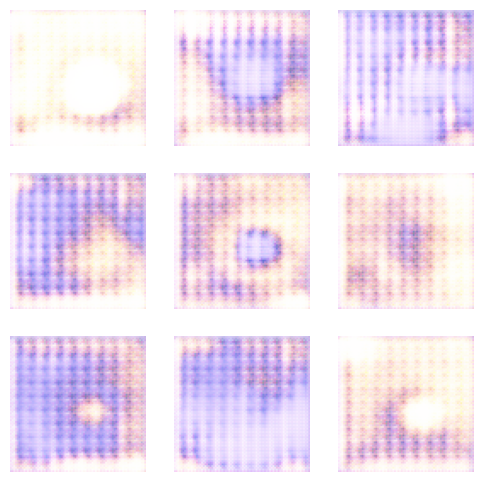

Epochs: 125, Generator Loss: 11.792654037475586, Discriminator Loss: 0.018177852034568787


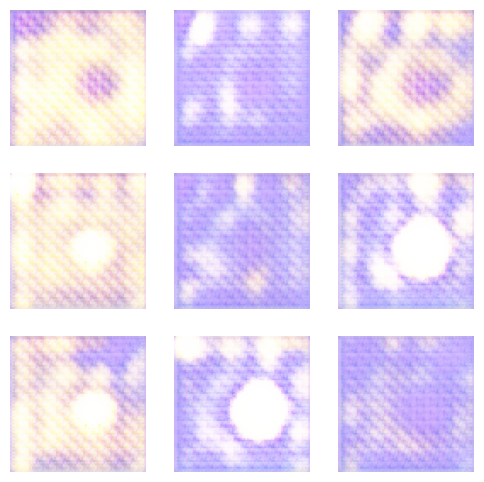

Epochs: 150, Generator Loss: 8.489953994750977, Discriminator Loss: 0.03350881487131119


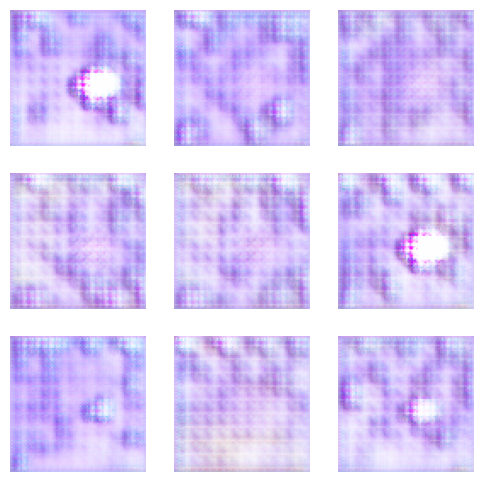

Epochs: 175, Generator Loss: 10.749189376831055, Discriminator Loss: 0.020122777670621872


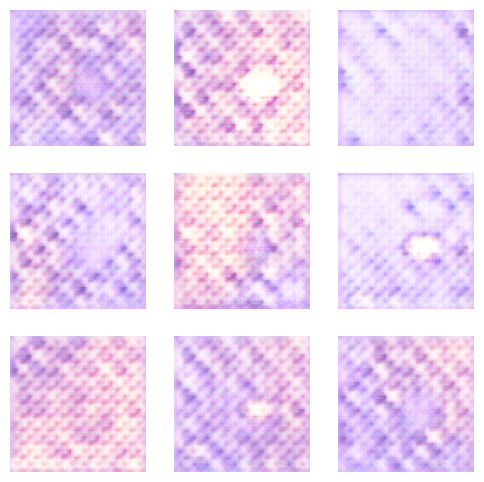

Epochs: 200, Generator Loss: 7.259041786193848, Discriminator Loss: 0.03924218565225601


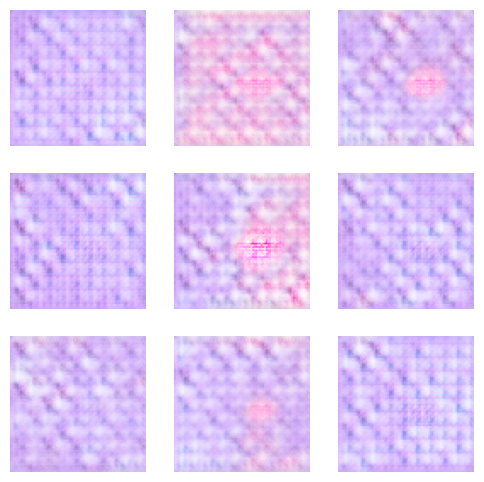

Epochs: 225, Generator Loss: 10.330331802368164, Discriminator Loss: 0.04105796292424202


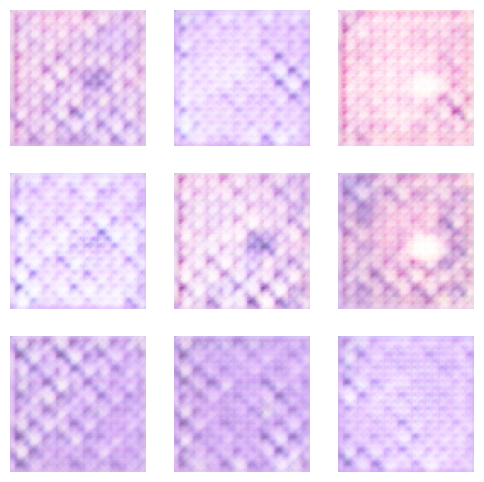

Epochs: 250, Generator Loss: 6.483848571777344, Discriminator Loss: 0.14728586375713348


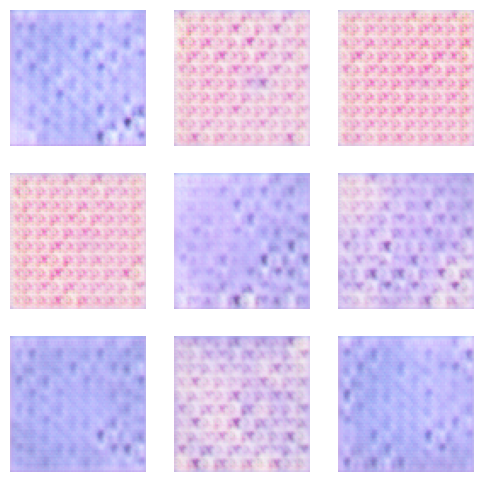

Epochs: 275, Generator Loss: 9.704763412475586, Discriminator Loss: 0.027613576501607895


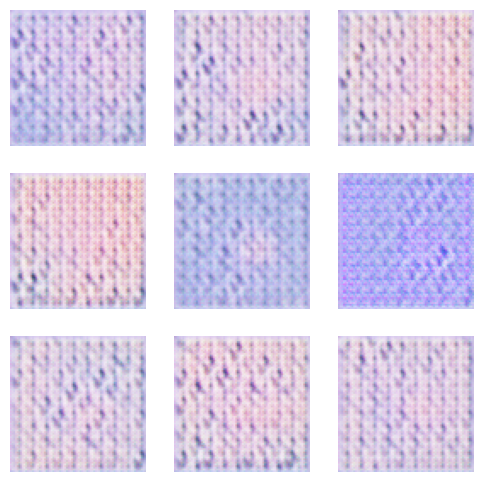

Epochs: 300, Generator Loss: 12.447223663330078, Discriminator Loss: 0.01648983545601368


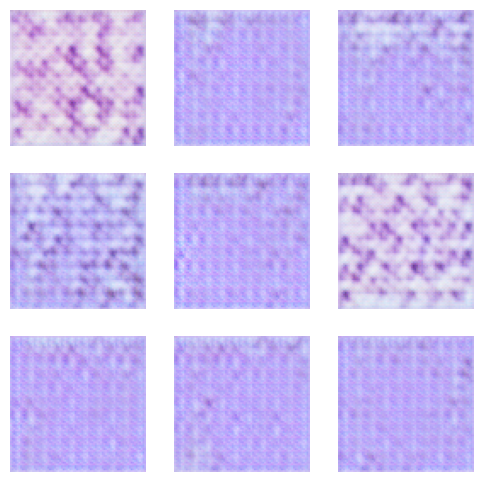

Epochs: 325, Generator Loss: 12.17428970336914, Discriminator Loss: 0.5192999839782715


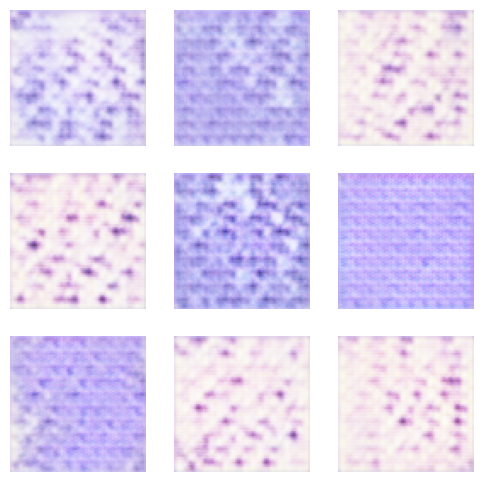

Epochs: 350, Generator Loss: 8.574933052062988, Discriminator Loss: 0.012831078842282295


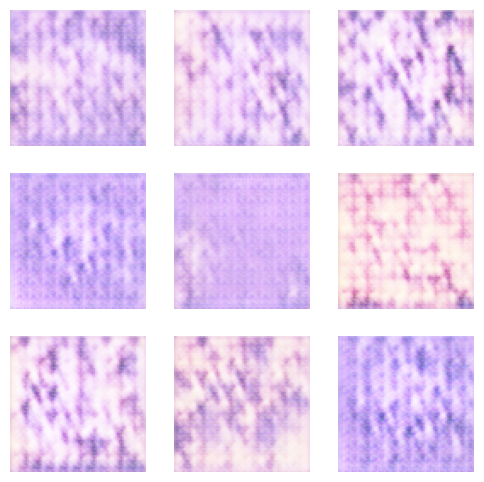

Epochs: 375, Generator Loss: 10.985884666442871, Discriminator Loss: 0.004932308569550514


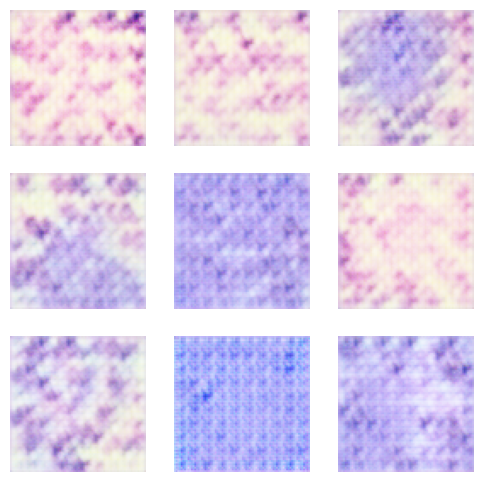

Epochs: 400, Generator Loss: 7.391088008880615, Discriminator Loss: 0.5066853761672974
Epochs: 400, Generator Loss: 7.391088008880615, Discriminator Loss: 0.5066853761672974


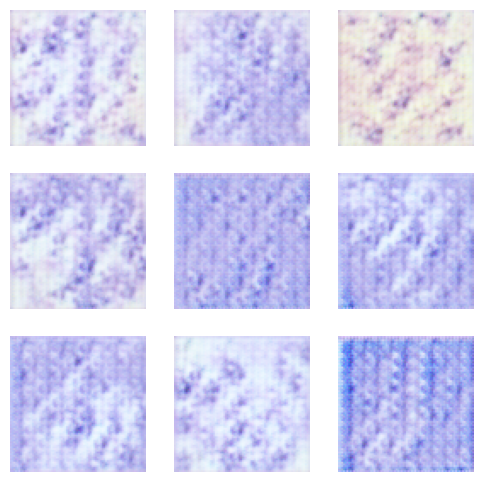

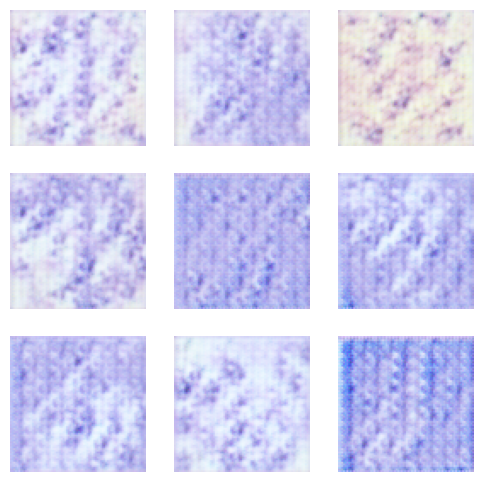

Epochs: 425, Generator Loss: 11.795063972473145, Discriminator Loss: 0.025846803560853004
Epochs: 425, Generator Loss: 11.795063972473145, Discriminator Loss: 0.025846803560853004


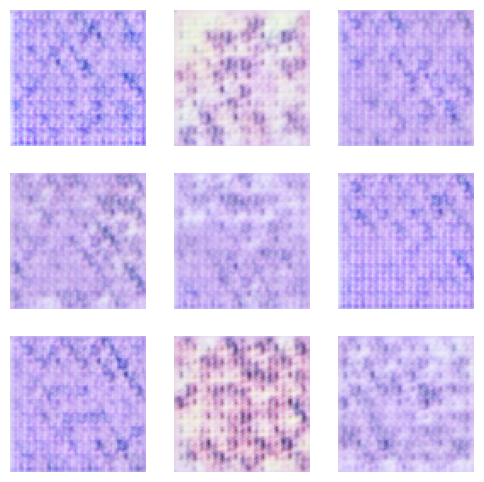

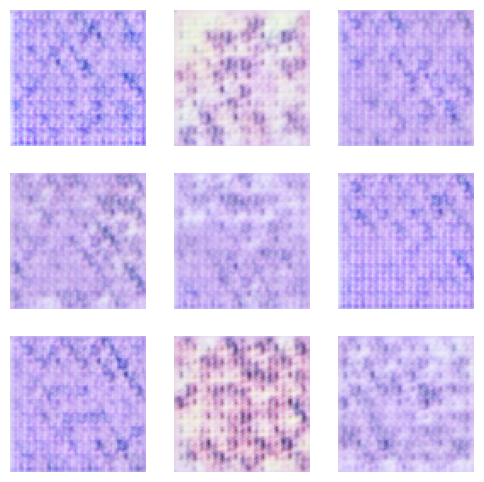

Epochs: 450, Generator Loss: 10.25329303741455, Discriminator Loss: 0.11799471080303192
Epochs: 450, Generator Loss: 10.25329303741455, Discriminator Loss: 0.11799471080303192


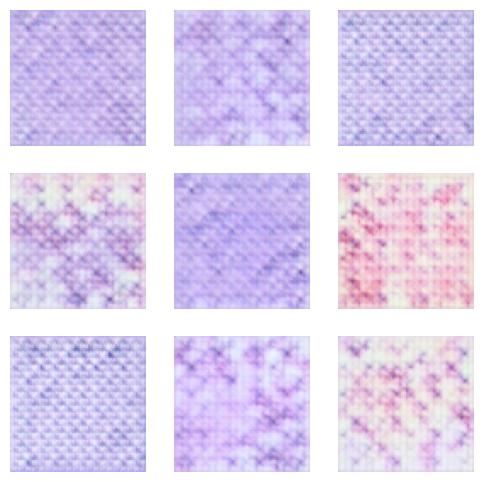

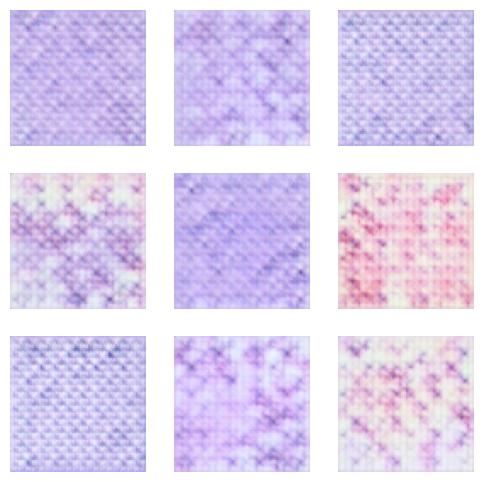

Epochs: 475, Generator Loss: 10.496162414550781, Discriminator Loss: 0.008310863748192787
Epochs: 475, Generator Loss: 10.496162414550781, Discriminator Loss: 0.008310863748192787


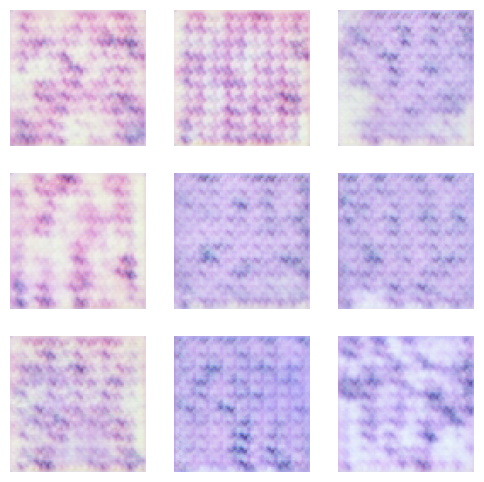

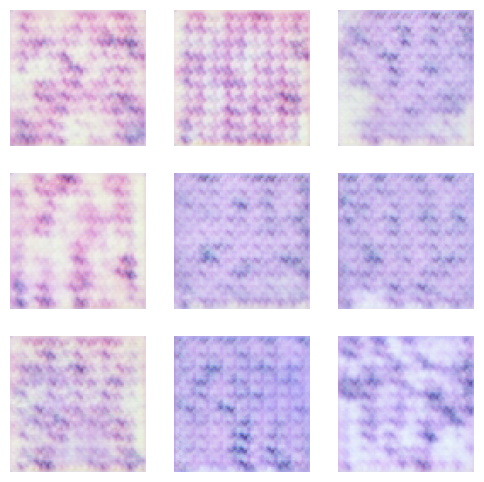

Epochs: 500, Generator Loss: 9.621415138244629, Discriminator Loss: 0.014040501788258553
Epochs: 500, Generator Loss: 9.621415138244629, Discriminator Loss: 0.014040501788258553


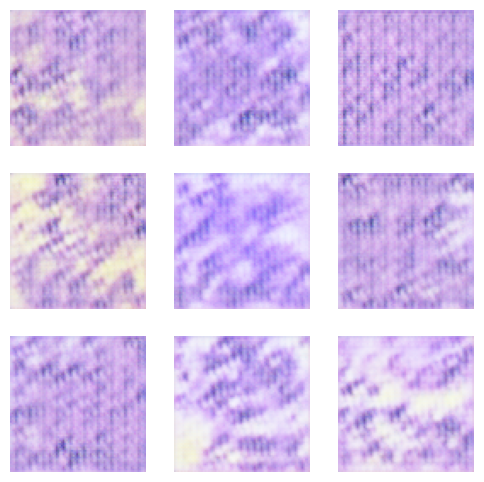

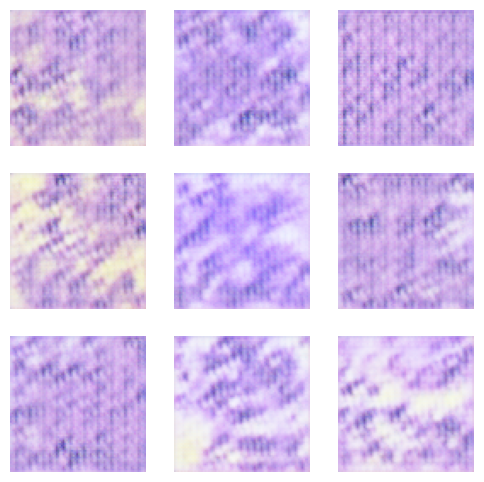

In [ ]:
import matplotlib.pyplot as plt

Epochs = 500
disc_losses = []
gen_losses = []

# Create a folder to store generated images
folder_name = '/content/drive/MyDrive/ColabNotebooks/Epochs'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

# Training
for i in range(Epochs):
    epoch_disc_loss = []
    epoch_gen_loss = []

    # iterating over images in dataset
    for image in train_dataset:
        gen_loss, disc_loss = train_step(image)

        # generator and discriminator losses are returned for each image and appended to each epoch
        epoch_disc_loss.append(disc_loss)
        epoch_gen_loss.append(gen_loss)

    disc_losses.append(np.mean(epoch_disc_loss))
    gen_losses.append(np.mean(epoch_gen_loss))

    # Display results after every 25 epochs
    if (i+1) % 25 == 0:
        print(f"Epochs: {i+1}, Generator Loss: {gen_losses[-1]}, Discriminator Loss: {disc_losses[-1]}")

        # Display and save generated images
        noise = tf.random.normal([BATCH_SIZE, 128])
        preds = generator(noise, training=False)
        fig = plt.figure(figsize=(6, 6))
        for j in range(9):
            plt.subplot(3, 3, j+1)
            plt.imshow((preds[j, :, :, :]+1.)/2.)
            plt.axis('off')
        plt.savefig(f'{folder_name}/epoch_{i+1:03}.jpg')
        plt.show()

Epochs: 25, Generator Loss: 12.014338493347168, Discriminator Loss: 0.059347011148929596


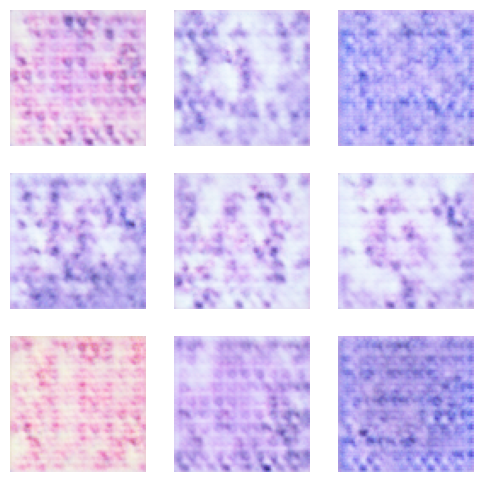

Epochs: 50, Generator Loss: 8.471015930175781, Discriminator Loss: 0.2786080837249756


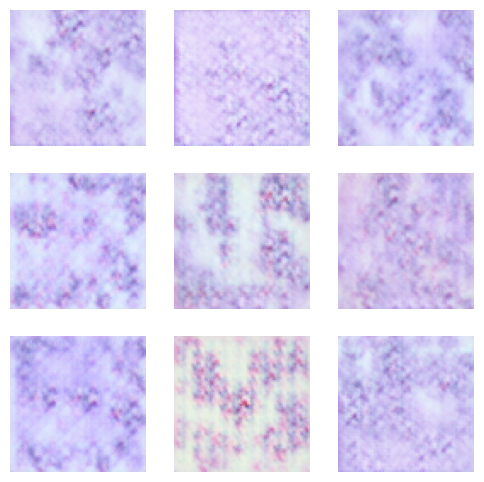

In [ ]:
Epochs = 50 # Extra 100 epochs
disc_losses = []
gen_losses = []

# Create a folder to store generated images
folder_name = '/content/drive/MyDrive/ColabNotebooks/Epochsnew'
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

# Training
for i in range(Epochs):
    epoch_disc_loss = []
    epoch_gen_loss = []

    # Iterating over images in dataset
    for image in train_dataset:
        gen_loss, disc_loss = train_step(image)

        # Generator and Discriminator losses are returned for each image and appended to each epoch
        epoch_disc_loss.append(disc_loss)
        epoch_gen_loss.append(gen_loss)

    disc_losses.append(np.mean(epoch_disc_loss))
    gen_losses.append(np.mean(epoch_gen_loss))

    # Display results after every 25 epochs
    if (i+1) % 25 == 0:
        print(f"Epochs: {i+1}, Generator Loss: {gen_losses[-1]}, Discriminator Loss: {disc_losses[-1]}")

        # Display and save generated images
        noise = tf.random.normal([BATCH_SIZE, 128])
        preds = generator(noise, training=False)
        fig = plt.figure(figsize=(6, 6))
        for j in range(9):
            plt.subplot(3, 3, j+1)
            plt.imshow((preds[j, :, :, :]+1.)/2.)
            plt.axis('off')
        plt.savefig(f'{folder_name}/epoch_{i+1:03}.jpg')
        plt.show()

# Save model and images

In [ ]:
generator.save('/content/drive/MyDrive/ColabNotebooks/COMP3931/generator.keras')
discriminator.save('/content/drive/MyDrive/ColabNotebooks/COMP3931/discriminator.keras')

In [ ]:
import os
import numpy as np
from keras.models import load_model
from PIL import Image

# Define a function to generate and save images
def save_generated_images(generator, output_dir, num_images):
    os.makedirs(output_dir, exist_ok=True)
    noise = np.random.normal(0, 1, size=(num_images, latent_dim))  # latent_dim is the dimension of the input noise
    generated_images = generator.predict(noise)

    for i in range(num_images):
        image = ((generated_images[i] + 1) * 127.5).astype(np.uint8)  # Denormalize the image
        image = Image.fromarray(image)
        image.save(os.path.join(output_dir, f'generated_image_{i}.png'))

# Specify the output directory
output_directory = '/content/drive/MyDrive/ColabNotebooks/COMP3931/gen_images'

# Generate and save images
save_generated_images(generator, output_directory, num_images=300)

10/10 [==============================] - 0s 29ms/step
